In [130]:
import matplotlib.pyplot as plt
import numpy as np
import cv2
import tqdm

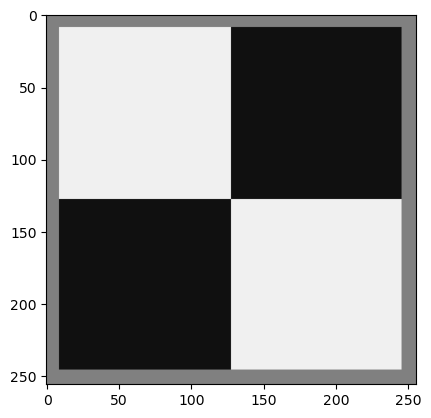

In [2]:
img = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input0.png")
plt.imshow(img, cmap="grey")
plt.show()

In [3]:
# Setting parameter values 
t_lower = 50  # Lower Threshold 
t_upper = 150  # Upper threshold 

# Applying the Canny Edge filter 
edge = cv2.Canny(img, t_lower, t_upper)

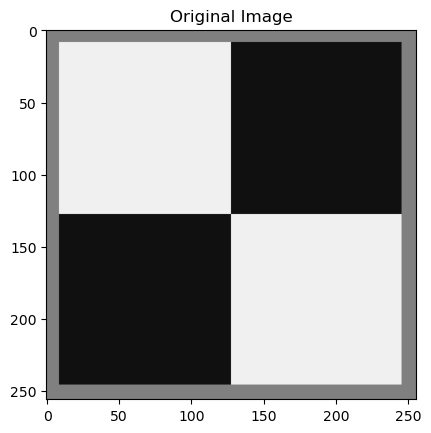

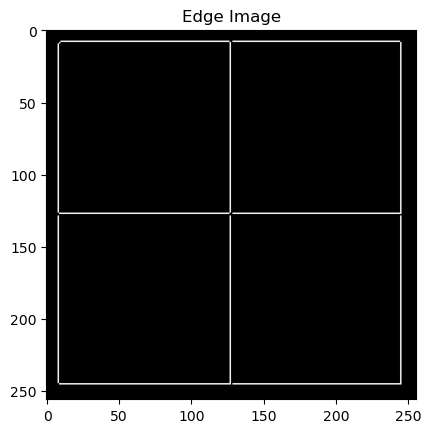

In [4]:
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.show()
plt.imshow(edge, cmap='gray')
plt.title('Edge Image')
plt.show()

In [5]:
def hough_lines_acc(img, rho_res=1, thetas=np.arange(-90, 90, 1)):
    # initialize Hough accumulator (filled with zeros)
    diag_len = int(np.ceil(np.sqrt(img.shape[0] ** 2 + img.shape[1] ** 2)))
    rhos = np.arange(-diag_len, diag_len, rho_res)
    acc = np.zeros((len(rhos), len(thetas)))

    # Each edge pixel vote for its corresponding lines
    edges = np.argwhere(img > 0)
    for p in edges:
        for t_idx in range(len(thetas)):
            theta = thetas[t_idx] * np.pi / 180
            rho = int(p[1] * np.cos(theta) + p[0] * np.sin(theta))
            rho_idx = np.argmin(np.abs(rhos - rho))
            acc[rho_idx, t_idx] += 1

    return acc, thetas, rhos

In [6]:
H, thetas, rhos = hough_lines_acc(edge)

In [7]:
print(H.shape)
print("Thetas shape: ", thetas.shape)
print("Rhos shape: ", rhos.shape)
print(np.max(H))
print(np.unique(H))
H_normalized = (H / np.max(H) * 255).astype("uint8")
print(np.unique(H_normalized))
print(np.max(H_normalized))
print(H.dtype)
print(H_normalized.dtype)

(726, 180)
Thetas shape:  (180,)
Rhos shape:  (726,)
236.0
[  0.   1.   2.   3.   4.   5.   6.   7.   8.   9.  10.  11.  12.  13.
  14.  15.  16.  17.  18.  19.  20.  21.  22.  23.  24.  26.  27.  28.
  29.  30.  31.  32.  40.  45.  47.  48.  50.  52.  53.  56.  57.  58.
  59.  60. 108. 128. 223. 233. 235. 236.]
[  0   1   2   3   4   5   6   7   8   9  10  11  12  14  15  16  17  18
  19  20  21  22  23  24  25  28  29  30  31  32  33  34  43  48  50  51
  54  56  57  60  61  62  63  64 116 138 240 251 253 255]
255
float64
uint8


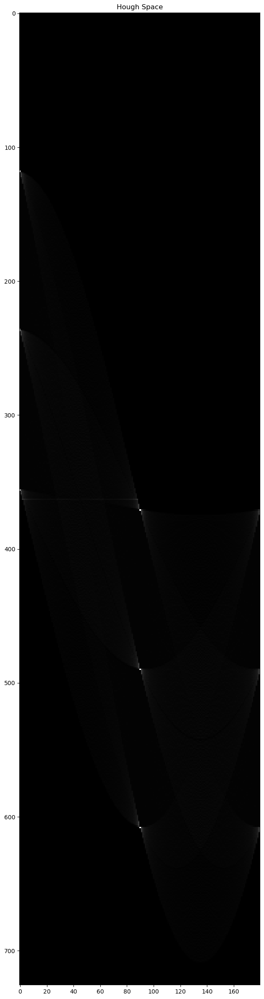

In [8]:
plt.figure(figsize=(10, 30))
plt.imshow(H_normalized, cmap='gray')
plt.title('Hough Space')
plt.show()

In [147]:
def hough_peaks(H, num_peaks, threshold=None, nhood_size=None):
    H = H.copy()
    if threshold is None:
        threshold = 0.5 * np.max(H)
    if nhood_size is None:
        nhood_size = np.ceil(np.array(H.shape) / 100).astype(int) * 2 + 1
    if isinstance(nhood_size, int):
        nhood_size = (nhood_size, nhood_size)
    peaks = []
    for i in range(num_peaks):
        x, y = np.unravel_index(np.argmax(H), H.shape)
        if H[x, y] >= threshold:
            peaks.append([x, y])
            x1 = np.max([x - nhood_size[0] // 2, 0])
            x2 = np.min([x + nhood_size[0] // 2, H.shape[0]])
            y1 = np.max([y - nhood_size[1] // 2, 0])
            y2 = np.min([y + nhood_size[1] // 2, H.shape[1]])
            H[x1:x2, y1:y2] = 0
        else:
            break
    return np.array(peaks)

In [10]:
peaks = hough_peaks(H, 10)

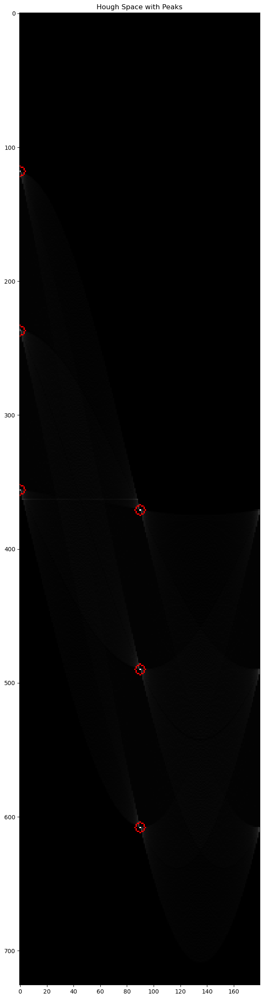

In [15]:
# highlight peaks on Hough space
H_peaks = cv2.cvtColor(H_normalized, cv2.COLOR_GRAY2BGR)
for peak in peaks:
    cv2.circle(H_peaks, tuple(peak[::-1]), 4, (255, 0, 0), 1)
plt.figure(figsize=(10, 30))
plt.imshow(H_peaks)
plt.title('Hough Space with Peaks')
plt.show()

In [28]:
def hough_lines_draw(img, peaks, rhos, thetas):
    img_out = np.copy(img)
    for peak in peaks:
        rho = rhos[peak[0]]
        theta = thetas[peak[1]] * np.pi / 180
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a * rho
        y0 = b * rho
        x1 = int(x0 + 1000 * (-b))
        y1 = int(y0 + 1000 * (a))
        x2 = int(x0 - 1000 * (-b))
        y2 = int(y0 - 1000 * (a))
        cv2.line(img_out, (x1, y1), (x2, y2), (0, 255, 0), 2)
    return img_out

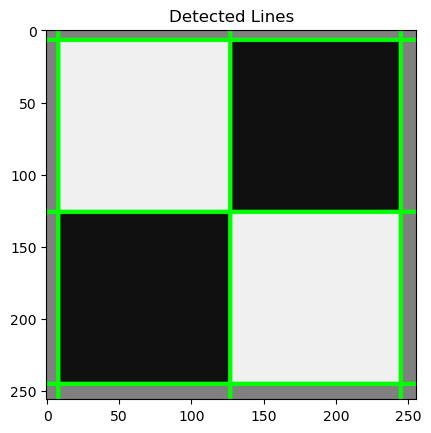

In [29]:
img_lines = hough_lines_draw(img, peaks, rhos, thetas)
plt.imshow(img_lines)
plt.title('Detected Lines')
plt.show()

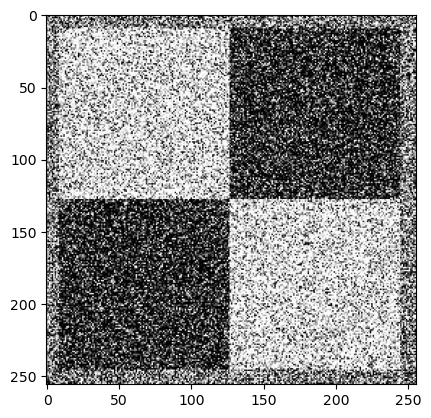

In [53]:
noised_image = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input0-noise.png")
plt.imshow(noised_image, cmap="grey")
plt.show()

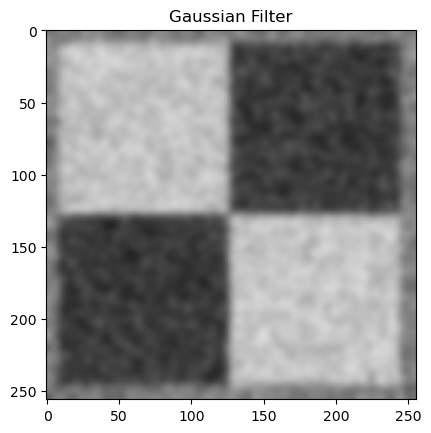

In [59]:
# Adding Gaussian noise to the image, using filter.
sigma = 3

gaussian_filter = cv2.GaussianBlur(noised_image, (0, 0), sigma)

plt.imshow(gaussian_filter, cmap='gray')
plt.title('Gaussian Filter')
plt.show()

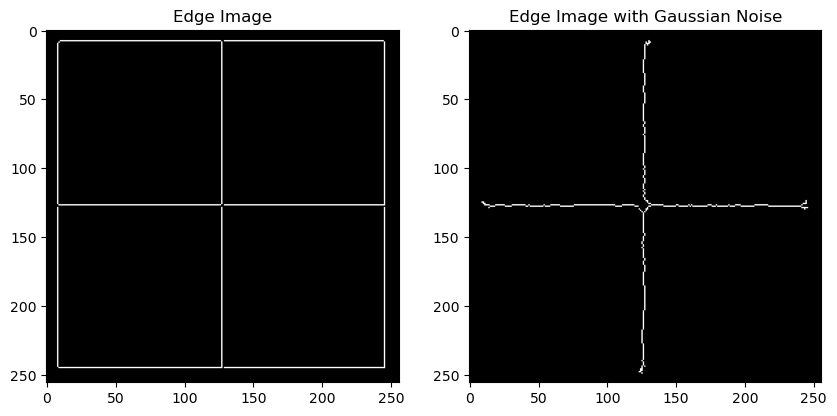

In [60]:
edges_gaussian = cv2.Canny(gaussian_filter, t_lower, t_upper)

# compare the edge detection results

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(edge, cmap='gray')
plt.title('Edge Image')
plt.subplot(1, 2, 2)
plt.imshow(edges_gaussian, cmap='gray')
plt.title('Edge Image with Gaussian Noise')
plt.show()

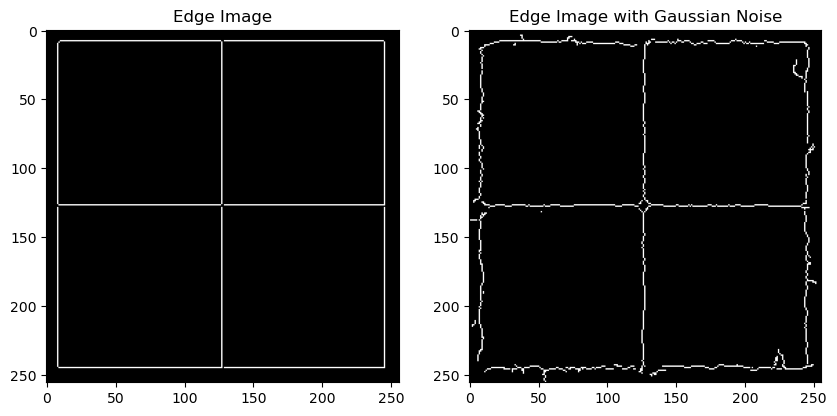

In [64]:
t_lower_gaussian = 30
t_upper_gaussian = 80
edges_gaussian = cv2.Canny(gaussian_filter, t_lower_gaussian, t_upper_gaussian)

# compare the edge detection results

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(edge, cmap='gray')
plt.title('Edge Image')
plt.subplot(1, 2, 2)
plt.imshow(edges_gaussian, cmap='gray')
plt.title('Edge Image with Gaussian Noise')
plt.show()

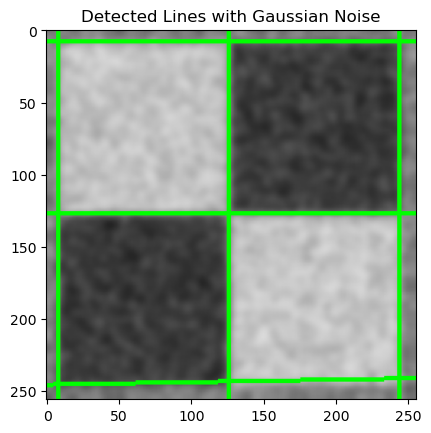

In [90]:
H_gaussian, thetas_gaussian, rhos_gaussian = hough_lines_acc(edges_gaussian)
peaks_gaussian = hough_peaks(H_gaussian, 10, threshold=78)
img_lines_gaussian = hough_lines_draw(gaussian_filter, peaks_gaussian, rhos_gaussian, thetas_gaussian)

plt.imshow(img_lines_gaussian)
plt.title('Detected Lines with Gaussian Noise')
plt.show()

To get good results for the blurred image, I had to decrease the canny edge detector thresholds and increase the hough transform peaks threshold.

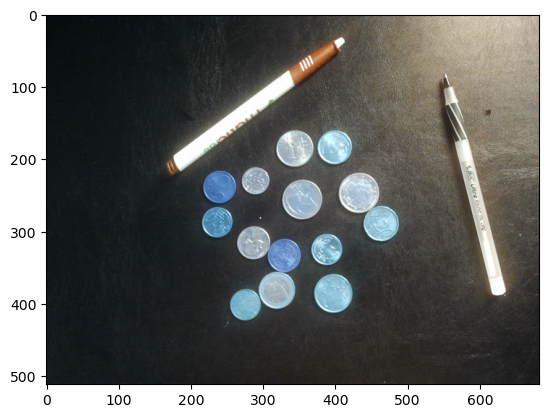

In [92]:
img = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input1.png")
plt.imshow(img)
plt.show()

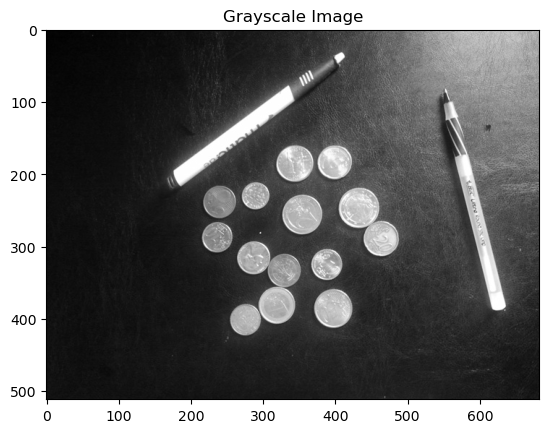

In [95]:
# Convert to grayscale
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img, cmap='gray')
plt.title('Grayscale Image')
plt.show()

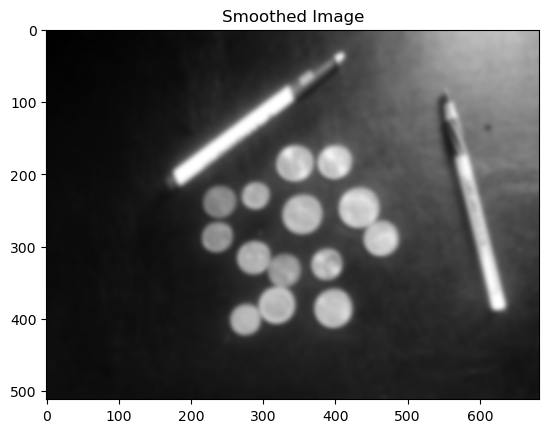

In [99]:
# smooth using Gaussian filter
sigma = 3
img_smooth = cv2.GaussianBlur(img, (0, 0), sigma)
plt.imshow(img_smooth, cmap='gray')
plt.title('Smoothed Image')
plt.show()

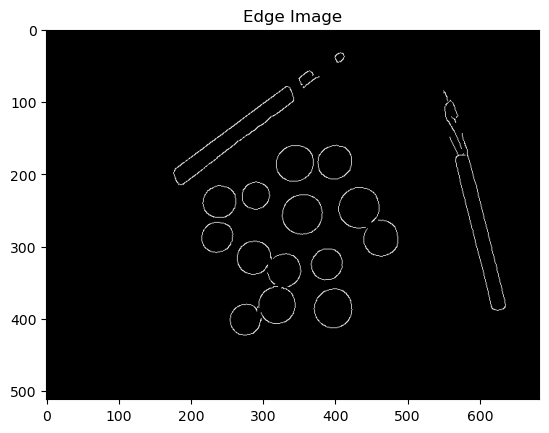

In [175]:
# apply Canny edge detector
t_lower = 50
t_upper = 120
edges = cv2.Canny(img_smooth, t_lower, t_upper)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.show()

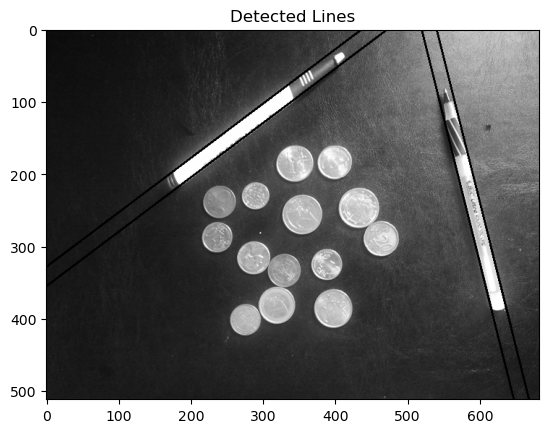

In [176]:
H, thetas, rhos = hough_lines_acc(edges)
peaks = hough_peaks(H, 10)
img_lines = hough_lines_draw(img, peaks, rhos, thetas)

plt.imshow(img_lines, cmap='gray')
plt.title('Detected Lines')
plt.show()

In [385]:
def hough_circles_acc(img, radius):
    # initialize Hough accumulator (filled with zeros)
    acc = np.zeros(img.shape)

    # find the indices of edge pixels
    edge_pixels = np.argwhere(img > 0)

    # for each edge pixel, find all possible circle centers
    for p in edge_pixels:
        for angle in np.arange(0, 2 * np.pi, 0.1):
            a = int(p[0] - radius * np.cos(angle))
            b = int(p[1] - radius * np.sin(angle))
            if 0 <= a < img.shape[0] and 0 <= b < img.shape[1]:
                acc[a, b] += 1
    return acc

In [178]:
H = hough_circles_acc(edges, 20)
print(f"Scaled Hough Space: {H.shape}")
print(f"Image Shape: {img.shape}")
centers = hough_peaks(H, 10)

Scaled Hough Space: (512, 683)
Image Shape: (512, 683)


In [179]:
# draw circles on the image
img_circles = np.copy(img)
img_circles = cv2.cvtColor(img_circles, cv2.COLOR_GRAY2BGR)
for center in centers:
    cv2.circle(img_circles, tuple(center[::-1]), 20, (0, 255, 0), 2)

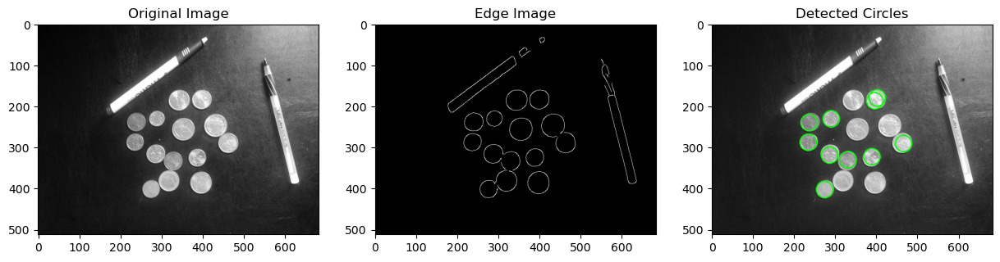

In [180]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Original Image')
plt.subplot(1, 3, 2)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.subplot(1, 3, 3)
plt.imshow(img_circles)
plt.title('Detected Circles')
plt.show()

In [401]:
def find_circles(img, radii):
    centers = []
    centers_votes = []
    best_radii = []
    smallest_r = np.min(radii)
    for radius in tqdm.tqdm(radii):
        H = hough_circles_acc(img, radius)
        new_centers = hough_peaks(H, 10, 27)
        for new_center in new_centers:
            new_center_votes = H[new_center[0], new_center[1]]
            if len(centers) == 0:
                centers.append(new_center)
                centers_votes.append(new_center_votes)
                best_radii.append(radius)
                continue
            # check if there is a better radius to match for the center
            distances = {tuple(center): (center[0] - new_center[0]) ** 2 + (center[1] - new_center[1]) ** 2 for center
                         in centers}
            closest_center = min(distances, key=distances.get)
            if distances[closest_center] > radius ** 2 * 2.1:
                centers.append(new_center)
                centers_votes.append(new_center_votes)
                best_radii.append(radius)
            else:
                closest_center_idx = next(i for i, center in enumerate(centers) if tuple(center) == closest_center)
                if new_center_votes > centers_votes[closest_center_idx]:
                    # better center found, replace in arrays
                    centers[closest_center_idx] = new_center
                    centers_votes[closest_center_idx] = new_center_votes
                    best_radii[closest_center_idx] = radius
    return centers, best_radii

In [206]:
centers, radii = find_circles(edges, list(range(20, 50)))

100%|██████████| 30/30 [03:33<00:00,  7.11s/it]


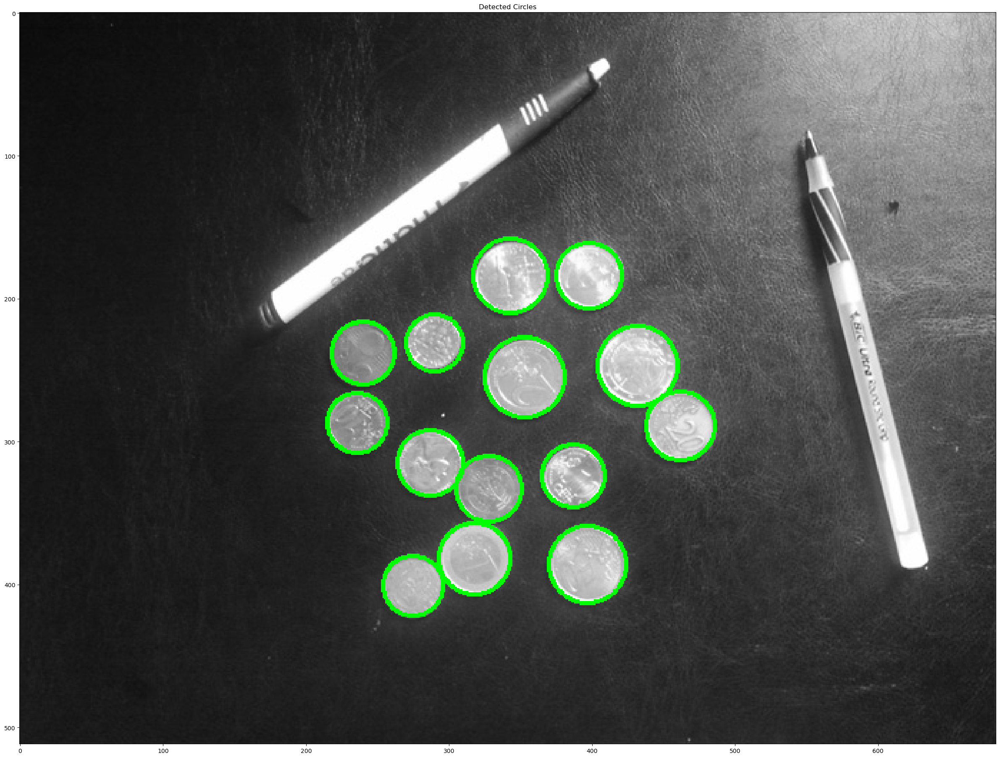

In [207]:
# draw circles on the image
img_circles = np.copy(img)
img_circles = cv2.cvtColor(img_circles, cv2.COLOR_GRAY2BGR)
for i in range(len(centers)):
    cv2.circle(img_circles, tuple(centers[i][::-1]), radii[i], (0, 255, 0), 2)

plt.figure(figsize=(30, 30))
plt.imshow(img_circles)
plt.title('Detected Circles')
plt.show()

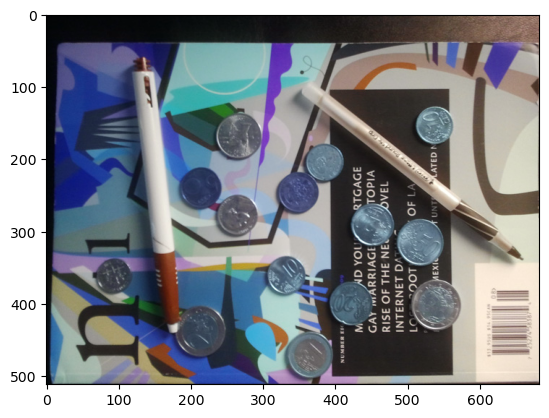

In [208]:
img = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input2.png")
plt.imshow(img)
plt.show()

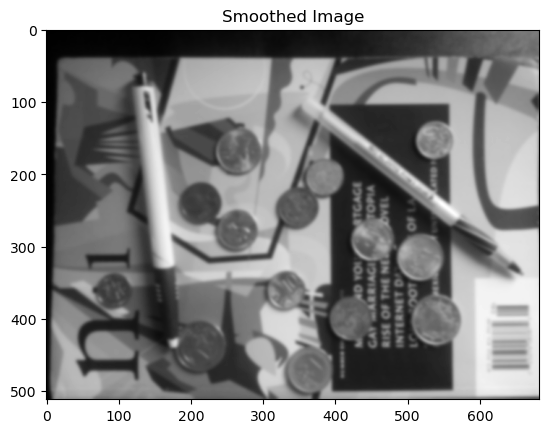

In [287]:
sigma = 2
img_smooth = cv2.GaussianBlur(img, (0, 0), sigma)
img_smooth = cv2.cvtColor(img_smooth, cv2.COLOR_BGR2GRAY)
plt.imshow(img_smooth, cmap='gray')
plt.title('Smoothed Image')
plt.show()

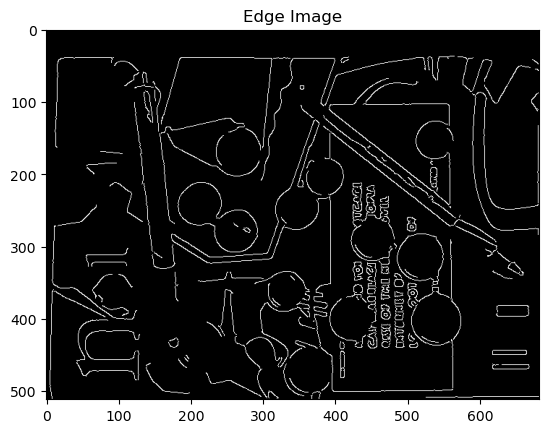

In [297]:
t_lower = 80
t_upper = 120
edges = cv2.Canny(img_smooth, t_lower, t_upper)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.show()

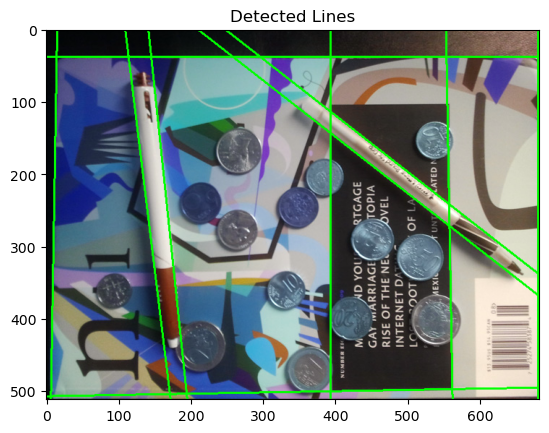

In [298]:
# finding lines
H, thetas, rhos = hough_lines_acc(edges)
peaks = hough_peaks(H, 10)
img_lines = hough_lines_draw(img, peaks, rhos, thetas)

plt.imshow(img_lines)
plt.title('Detected Lines')
plt.show()

The problem that causes more lines to be detected other than the pens is that the background has a lot of line edges.

In [300]:
# to solve this problem, we will look for nearby parallel lines.

print(peaks)

[[1006   38]
 [ 983   38]
 [ 816    0]
 [1362  179]
 [1407   89]
 [1247   90]
 [ 995   84]
 [ 962   83]
 [1534   90]
 [ 869   91]]


In [311]:
def find_nearby_parallel_lines(peaks, threshold_rho, threshold_theta):
    parallel_lines = []
    new_rhos = []
    new_thetas = []
    for i in range(len(peaks)):
        for j in range(i + 1, len(peaks)):
            rho_diff = np.abs(rhos[peaks[i][0]] - rhos[peaks[j][0]])
            theta_diff = min(np.abs(thetas[peaks[i][1]] - thetas[peaks[j][1]]), 180 - np.abs(thetas[peaks[i][1]] - thetas[peaks[j][1]]))
            if rho_diff < threshold_rho and theta_diff < threshold_theta:
                parallel_lines.extend([peaks[i], peaks[j]])
    return parallel_lines

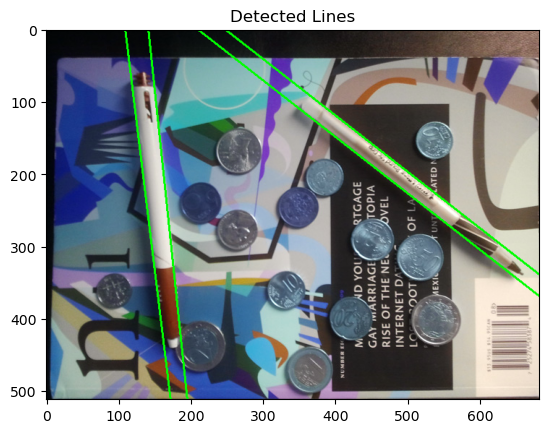

In [313]:
# plot new lines
new_peaks = find_nearby_parallel_lines(peaks, 50, 10)

img_lines = hough_lines_draw(img, new_peaks, rhos, thetas)
plt.imshow(img_lines)
plt.title('Detected Lines')
plt.show()

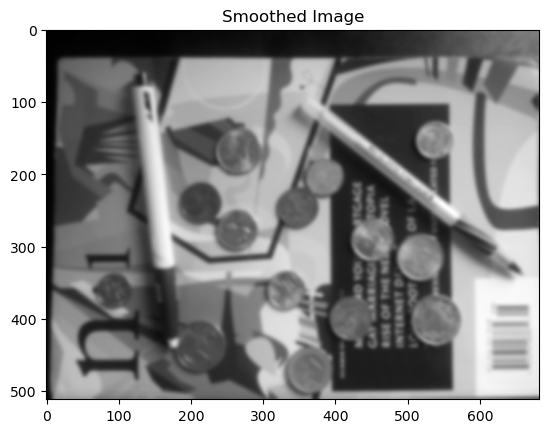

In [353]:
sigma = 2.5
img_smooth = cv2.GaussianBlur(img, (0, 0), sigma)
img_smooth = cv2.cvtColor(img_smooth, cv2.COLOR_BGR2GRAY)
plt.imshow(img_smooth, cmap='gray')
plt.title('Smoothed Image')
plt.show()

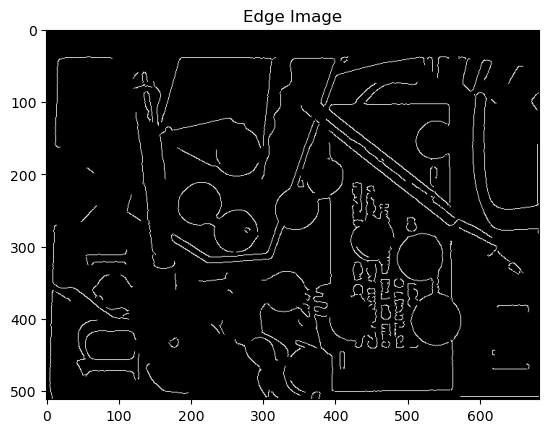

In [360]:
t_lower = 80
t_upper = 110
edges = cv2.Canny(img_smooth, t_lower, t_upper)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.show()

In [361]:
centers, radii = find_circles(edges, list(range(20, 50)))

100%|██████████| 30/30 [24:36<00:00, 49.22s/it]


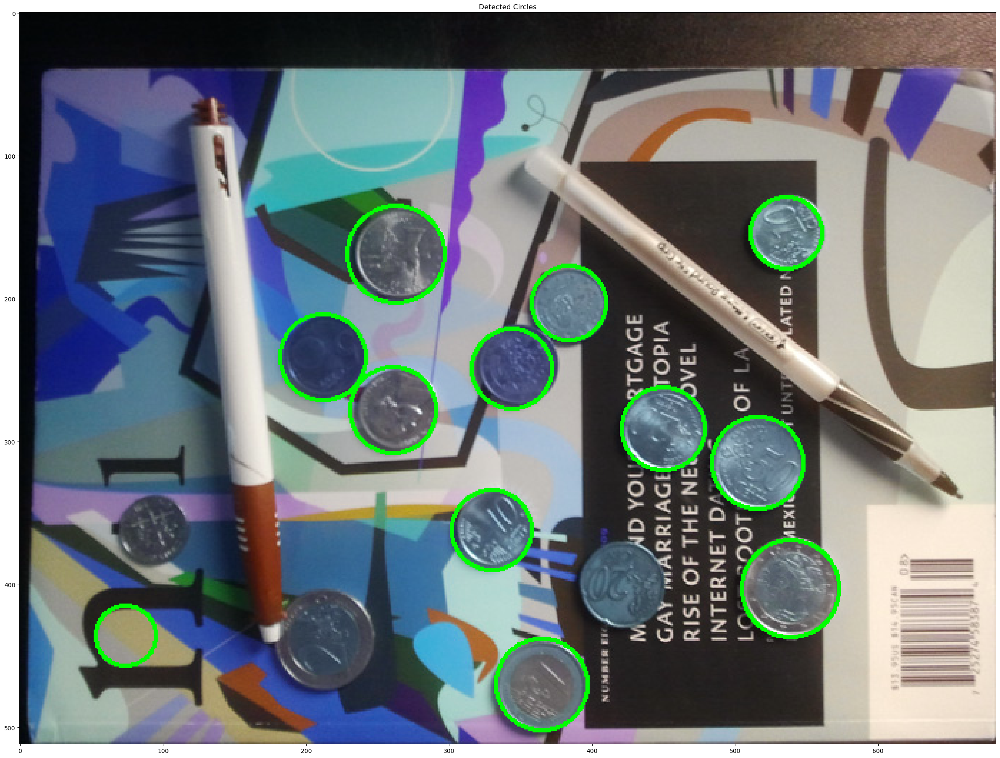

In [363]:
# draw circles on the image
img_circles = np.copy(img)
# img_circles = cv2.cvtColor(img_circles, cv2.COLOR_GRAY2BGR)
for i in range(len(centers)):
    cv2.circle(img_circles, tuple(centers[i][::-1]), radii[i], (0, 255, 0), 2)

plt.figure(figsize=(30, 30))
plt.imshow(img_circles)
plt.title('Detected Circles')
plt.show()

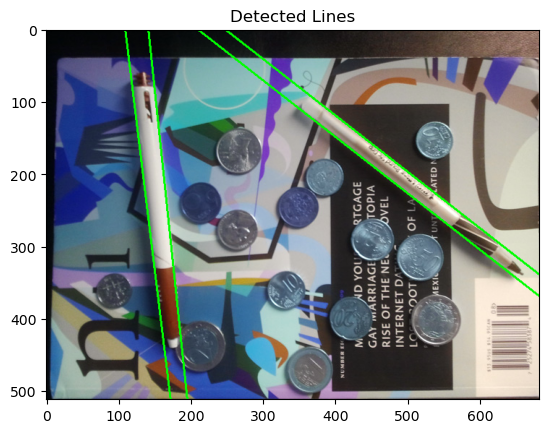

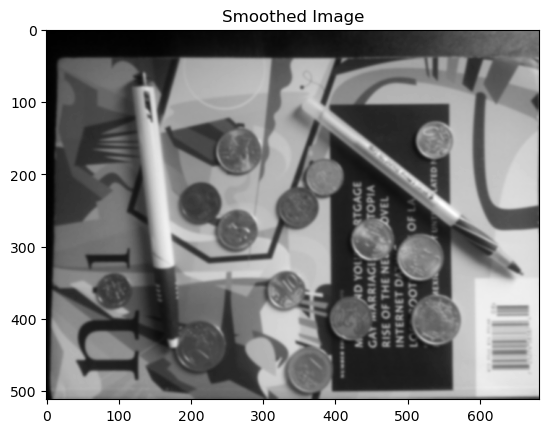

In [366]:
sigma = 1.5
img_smooth = cv2.GaussianBlur(img, (0, 0), sigma)
img_smooth = cv2.cvtColor(img_smooth, cv2.COLOR_BGR2GRAY)
plt.imshow(img_smooth, cmap='gray')
plt.title('Smoothed Image')
plt.show()

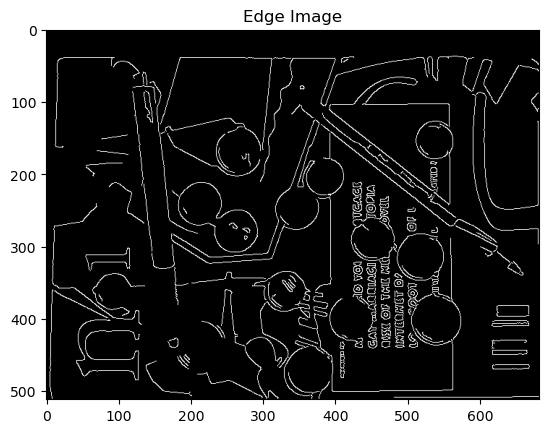

In [368]:
t_lower = 80
t_upper = 150
edges = cv2.Canny(img_smooth, t_lower, t_upper)
plt.imshow(edges, cmap='gray')
plt.title('Edge Image')
plt.show()

In [369]:
centers, radii = find_circles(edges, list(range(22, 28)))

100%|██████████| 6/6 [07:34<00:00, 75.79s/it]


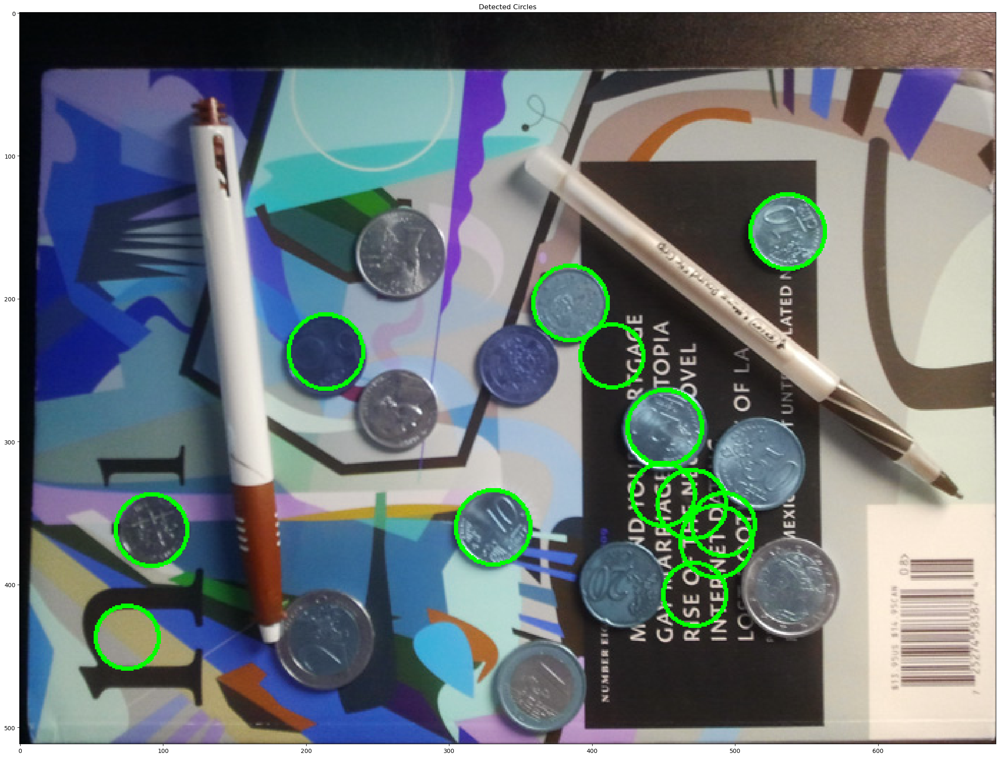

In [370]:
# draw circles on the image
img_circles = np.copy(img)
# img_circles = cv2.cvtColor(img_circles, cv2.COLOR_GRAY2BGR)
for i in range(len(centers)):
    cv2.circle(img_circles, tuple(centers[i][::-1]), radii[i], (0, 255, 0), 2)

plt.figure(figsize=(30, 30))
plt.imshow(img_circles)
plt.title('Detected Circles')
plt.show()

100%|██████████| 15/15 [15:19<00:00, 61.32s/it]


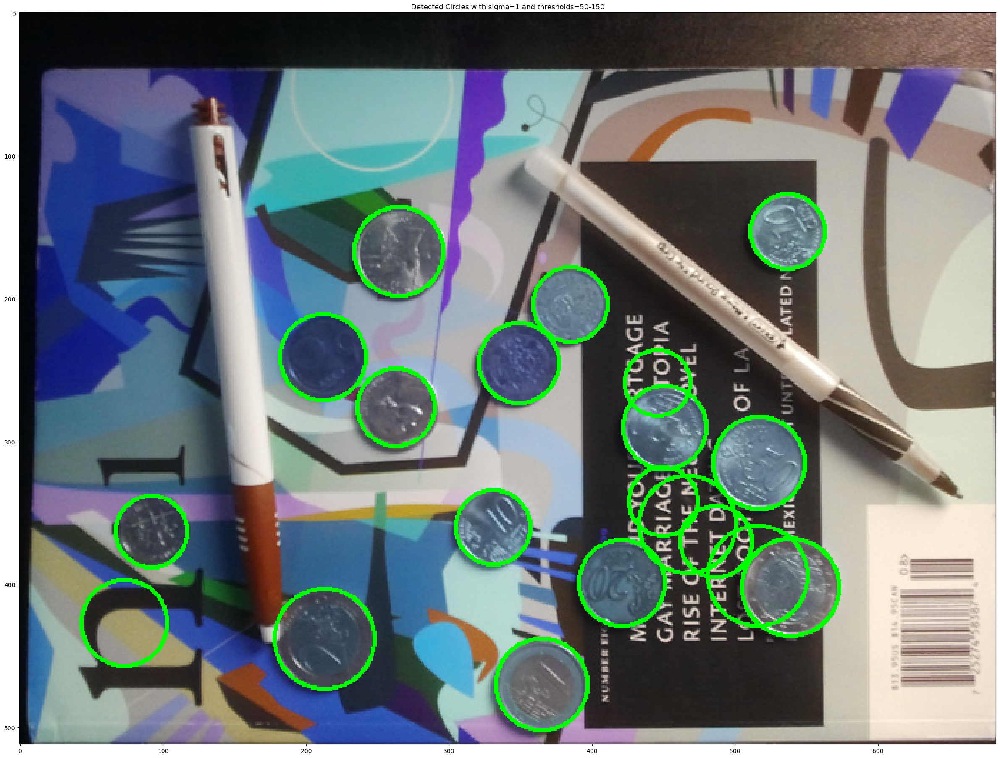

100%|██████████| 15/15 [11:21<00:00, 45.42s/it]


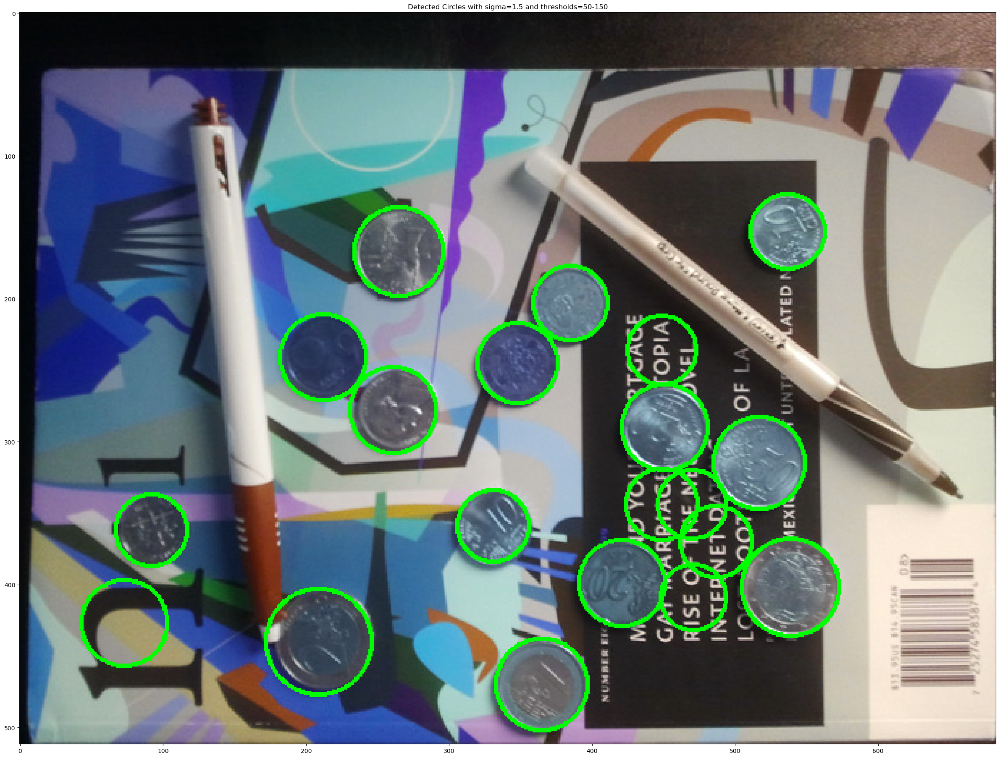

  0%|          | 0/15 [00:17<?, ?it/s]


KeyboardInterrupt: 

In [384]:
#  hyper parameter search for circles:

t_lowers_highers = [(50, 150), (30, 80), (80, 120)]
sigmas = [1, 1.5, 2, 2.5, 3]


img = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input2.png")
img_ = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

for t_lower, t_upper in t_lowers_highers:
    for sigma in sigmas:
        img_smooth = cv2.GaussianBlur(img_, (0, 0), sigma)
        edges = cv2.Canny(img_smooth, t_lower, t_upper)
        centers, radii = find_circles(edges, list(range(23, 38)))
        img_circles = np.copy(img)
        for i in range(len(centers)):
            cv2.circle(img_circles, tuple(centers[i][::-1]), radii[i], (0, 255, 0), 2)
        plt.figure(figsize=(30, 30))
        plt.imshow(img_circles)
        plt.title(f'Detected Circles with sigma={sigma} and thresholds={t_lower}-{t_upper}')
        plt.show()

100%|██████████| 15/15 [01:30<00:00,  6.05s/it]


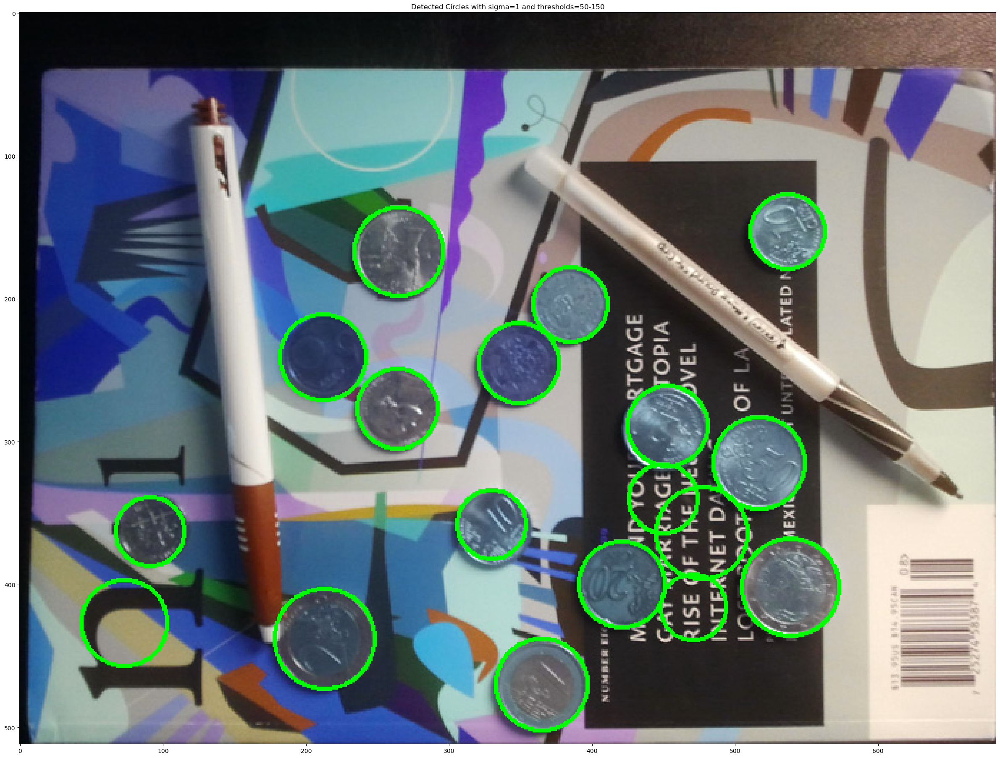

100%|██████████| 15/15 [01:11<00:00,  4.79s/it]


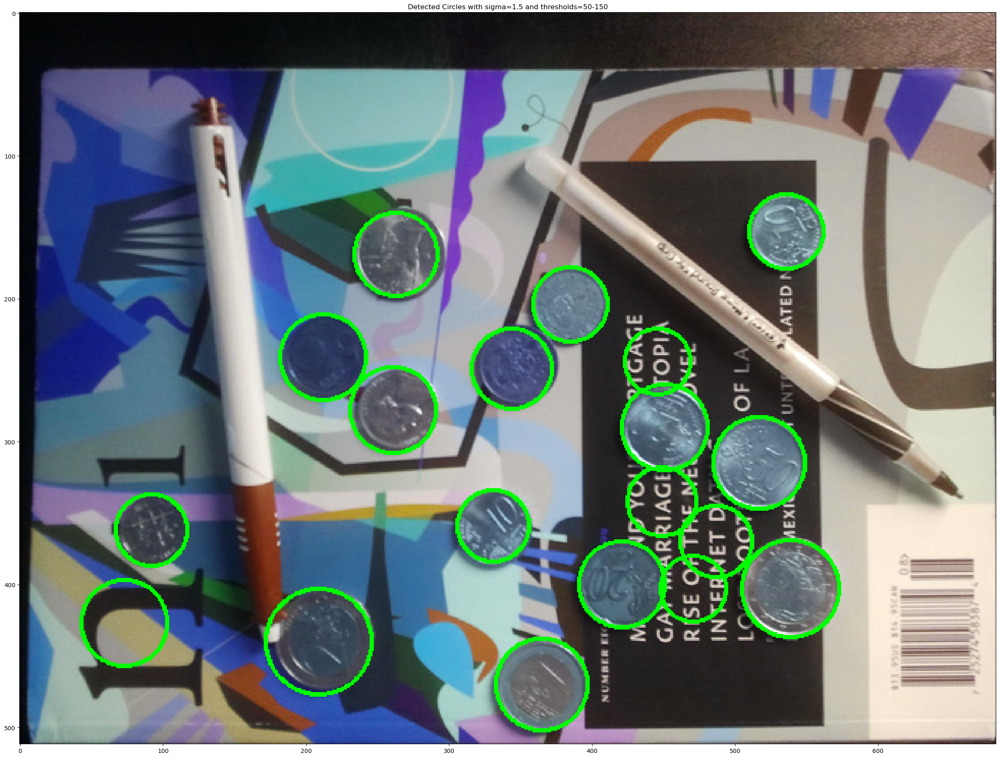

100%|██████████| 15/15 [00:54<00:00,  3.62s/it]


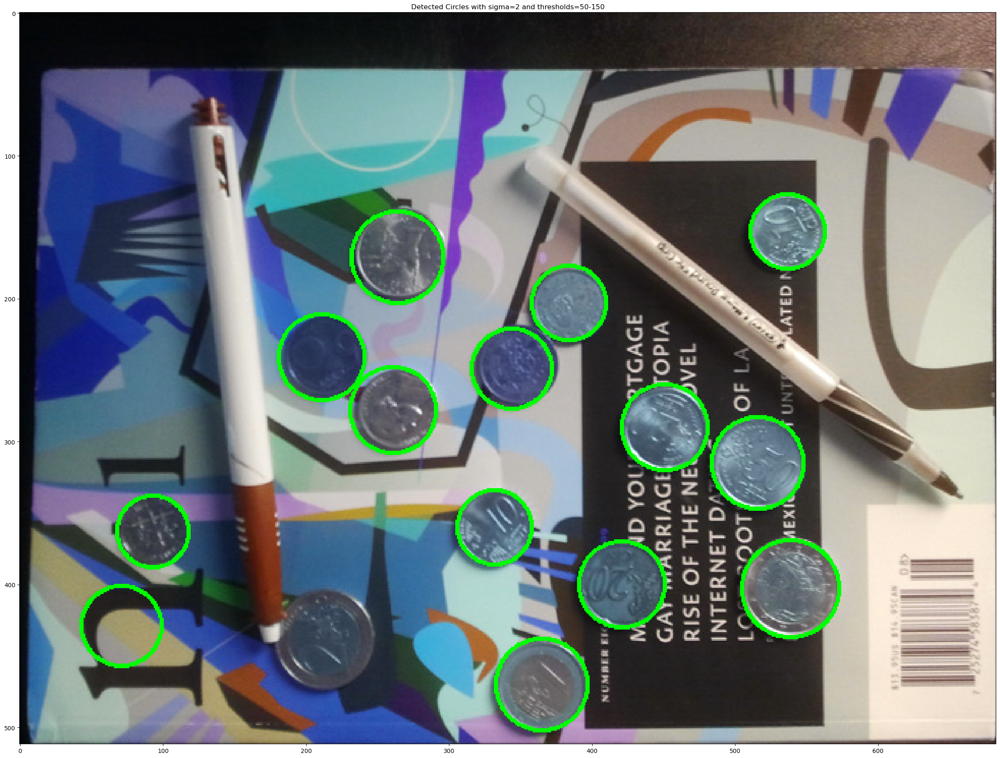

100%|██████████| 15/15 [00:34<00:00,  2.30s/it]


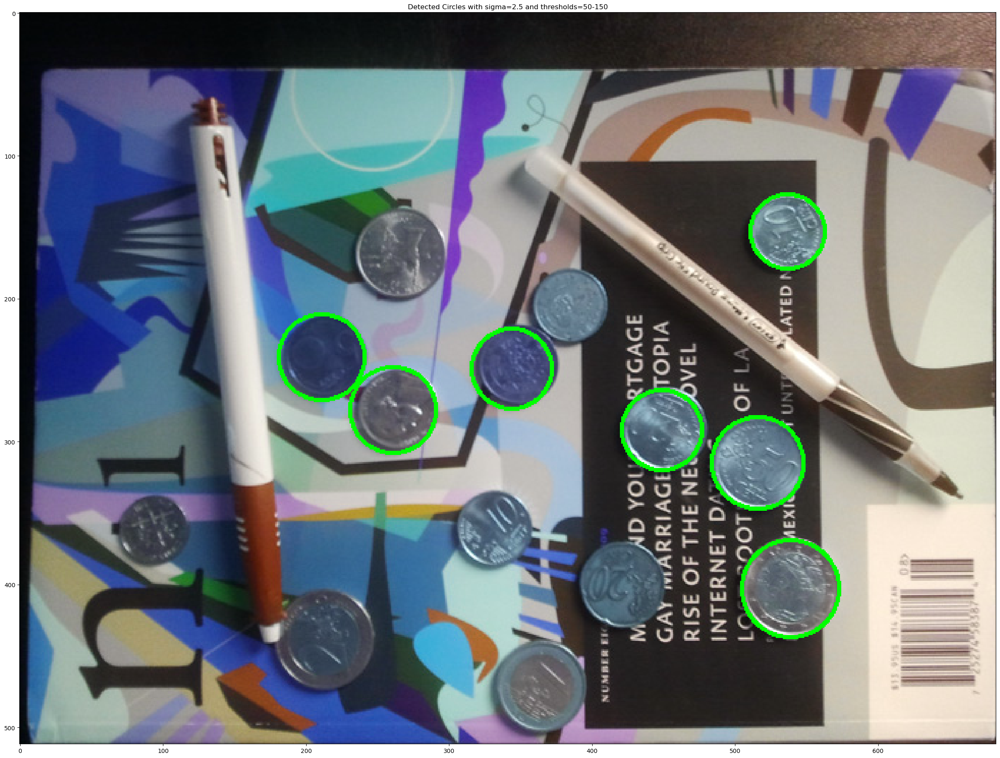

100%|██████████| 15/15 [00:22<00:00,  1.48s/it]


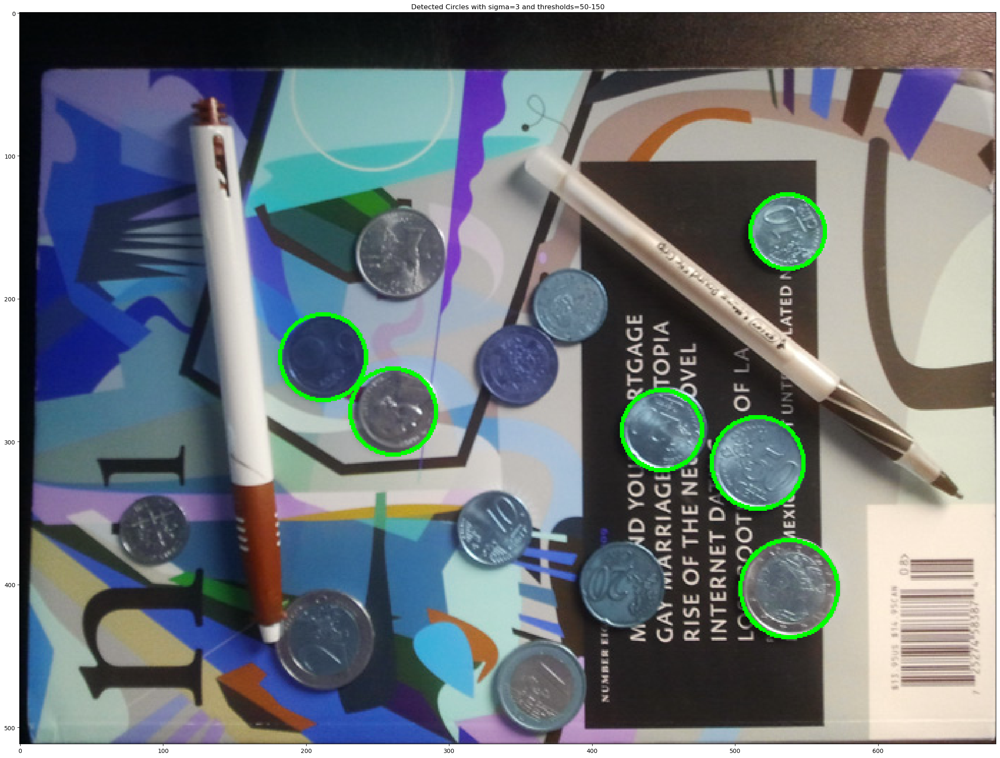

100%|██████████| 15/15 [01:54<00:00,  7.64s/it]


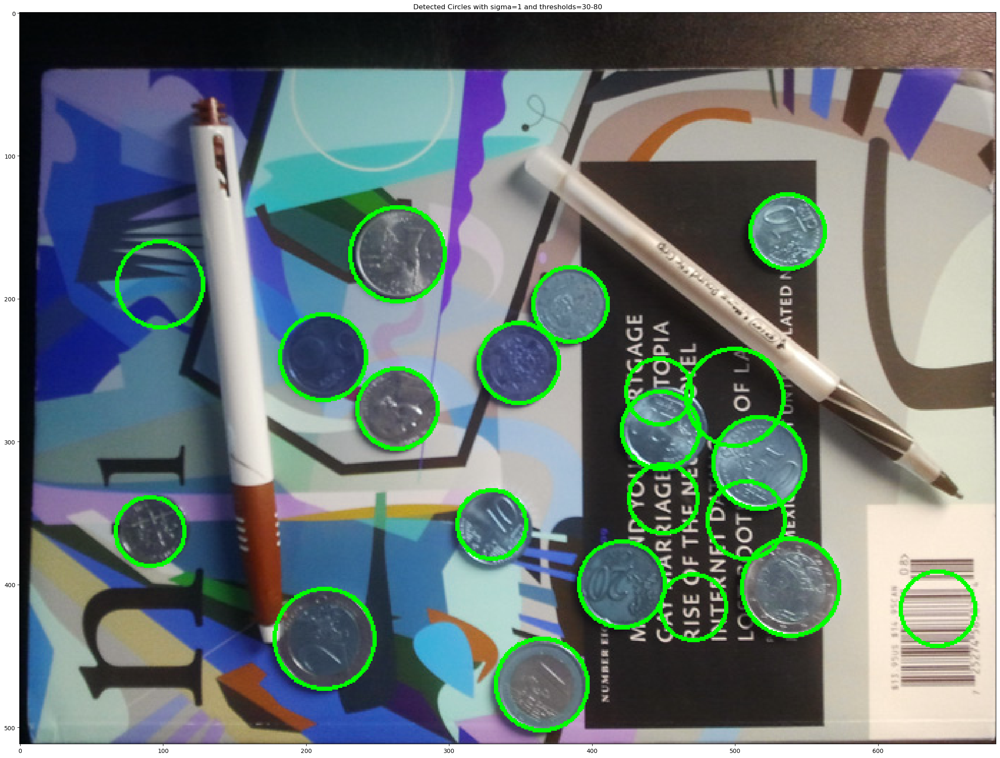

100%|██████████| 15/15 [01:31<00:00,  6.12s/it]


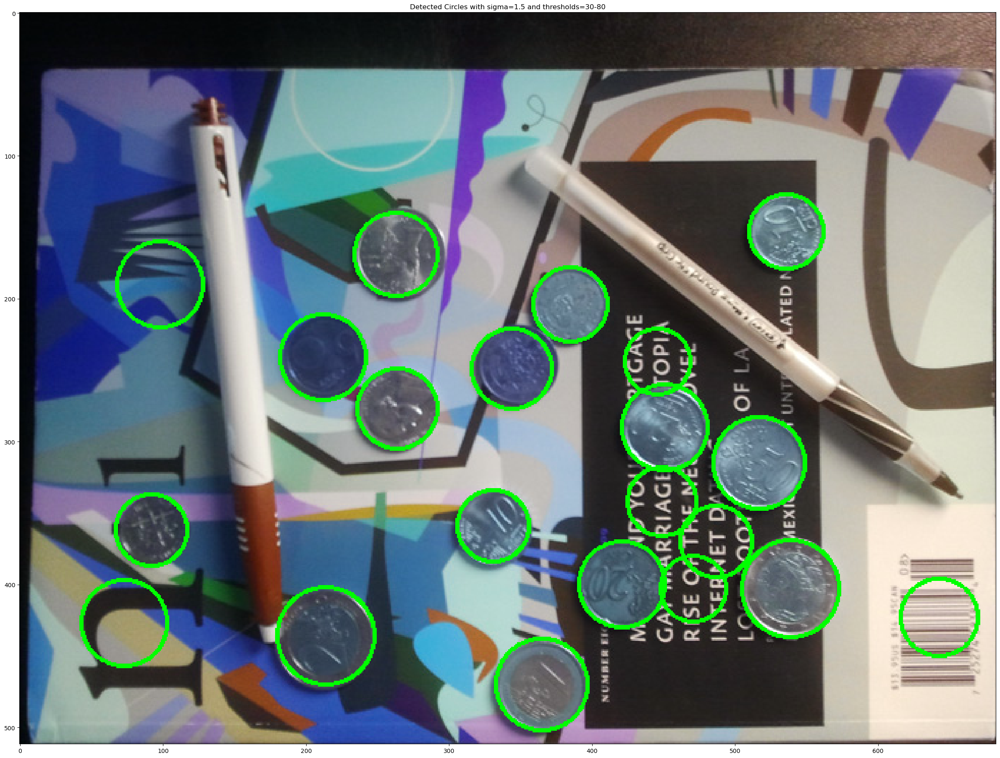

100%|██████████| 15/15 [01:16<00:00,  5.12s/it]


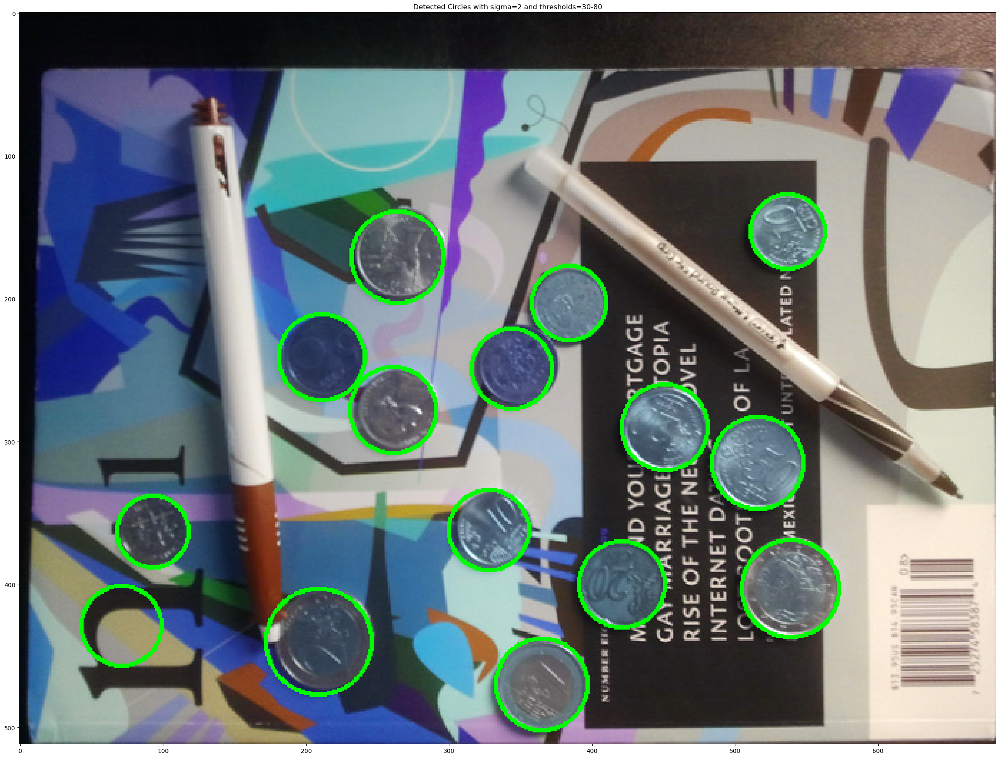

100%|██████████| 15/15 [00:53<00:00,  3.54s/it]


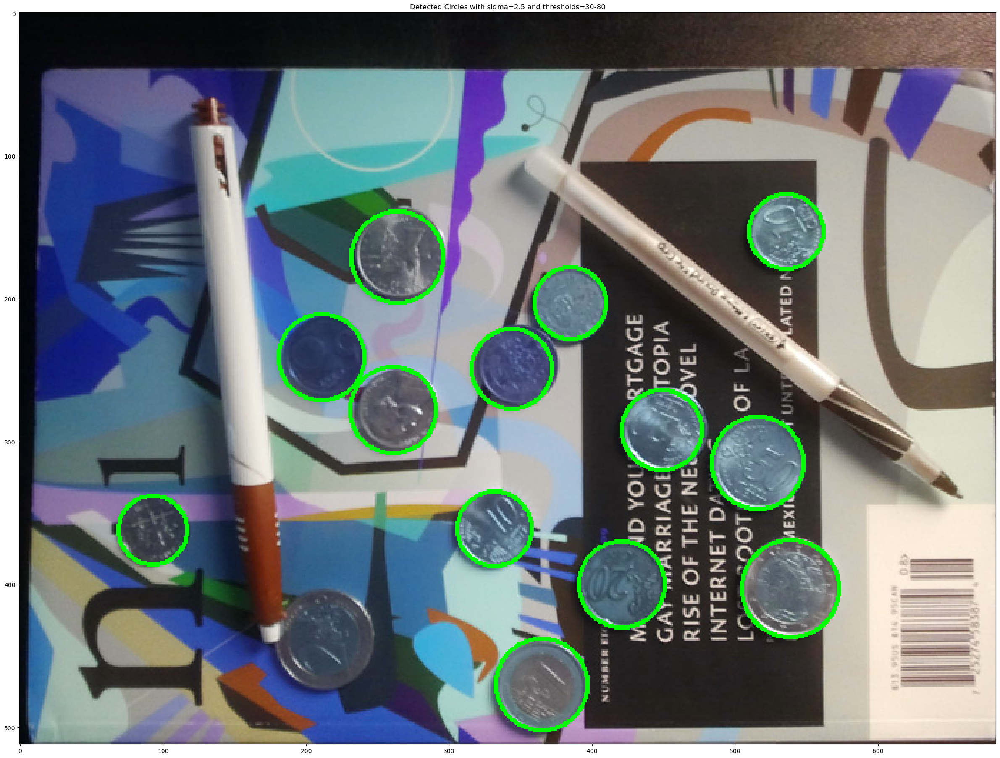

100%|██████████| 15/15 [00:41<00:00,  2.75s/it]


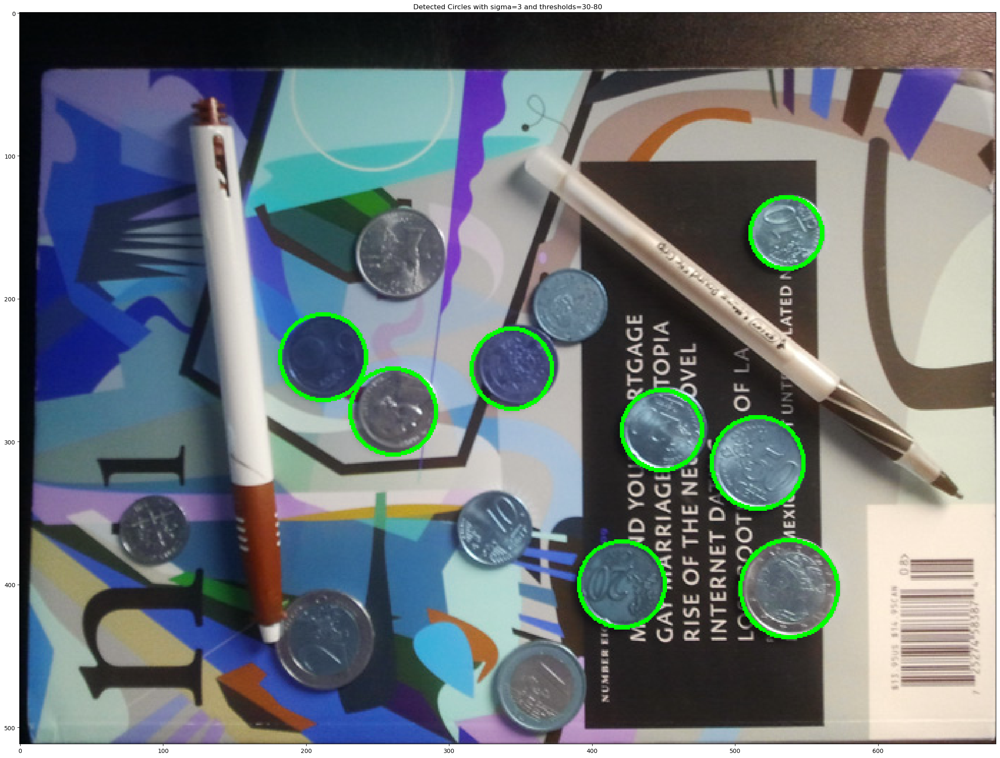

 13%|█▎        | 2/15 [00:16<01:44,  8.07s/it]


KeyboardInterrupt: 

In [400]:
#  hyper parameter search for circles:

t_lowers_highers = [(50, 150), (30, 80), (80, 120)]
sigmas = [1, 1.5, 2, 2.5, 3]


img = cv2.imread("D:\Projects\pythonProject\CV\course_resources\ps_1\ps1-input2.png")
img_ = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

for t_lower, t_upper in t_lowers_highers:
    for sigma in sigmas:
        img_smooth = cv2.GaussianBlur(img_, (0, 0), sigma)
        edges = cv2.Canny(img_smooth, t_lower, t_upper)
        centers, radii = find_circles(edges, list(range(23, 38)))
        img_circles = np.copy(img)
        for i in range(len(centers)):
            cv2.circle(img_circles, tuple(centers[i][::-1]), radii[i], (0, 255, 0), 2)
        plt.figure(figsize=(30, 30))
        plt.imshow(img_circles)
        plt.title(f'Detected Circles with sigma={sigma} and thresholds={t_lower}-{t_upper}')
        plt.show()